In [ ]:
Hugging Face Models 学习第一次作业

### Text classification

使用'cardiffnlp/twitter-roberta-base-sentiment-latest'模型进行情感内容分析，中文准确率不高

In [ ]:
from transformers import pipeline
model_path='cardiffnlp/twitter-roberta-base-sentiment-latest'
sentiment_task = pipeline("sentiment-analysis", model=model_path, tokenizer=model_path)
result=sentiment_task("今天成都的天气还好，就是有点热！")
print(result)

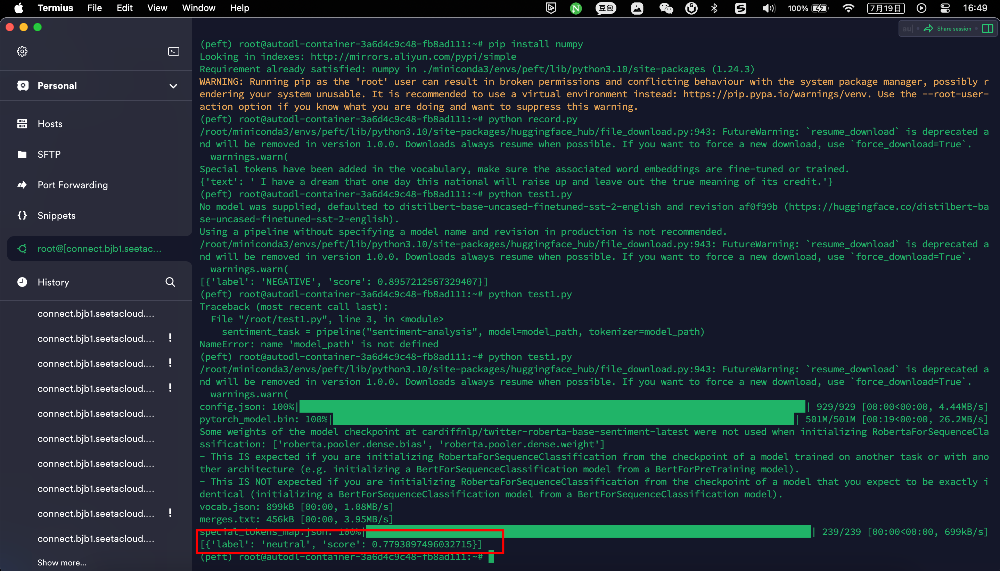

换了一个'hfl/chinese-roberta-wwm-ext'模型，进行对比

In [ ]:
from transformers import pipeline
model_path='hfl/chinese-roberta-wwm-ext'
sentiment_task = pipeline("sentiment-analysis", model=model_path, tokenizer=model_path)
text_list = [
    "今天成都的天气还好，就是有点热！",
    "I think the taste of the garlic mashed pork in this store is average.",
    "You learn things really quickly. You understand the theory class as soon as it is taught."
]
result=sentiment_task(text_list)
print(result)

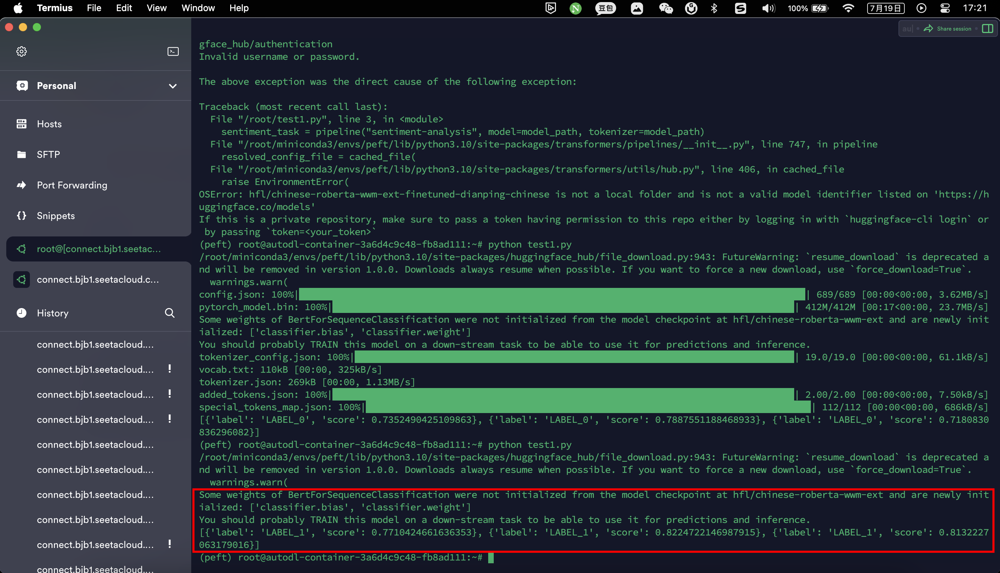

用英文的识别就要高很多

In [ ]:
from transformers import pipeline
model_path='cardiffnlp/twitter-roberta-base-sentiment-latest'
sentiment_task = pipeline("sentiment-analysis", model=model_path, tokenizer=model_path)
text_list = [
    "今天成都的天气还好，就是有点热！",
    "I think the taste of the garlic mashed pork in this store is average.",
    "You learn things really quickly. You understand the theory class as soon as it is taught."
]
result=sentiment_task(text_list)
print(result)

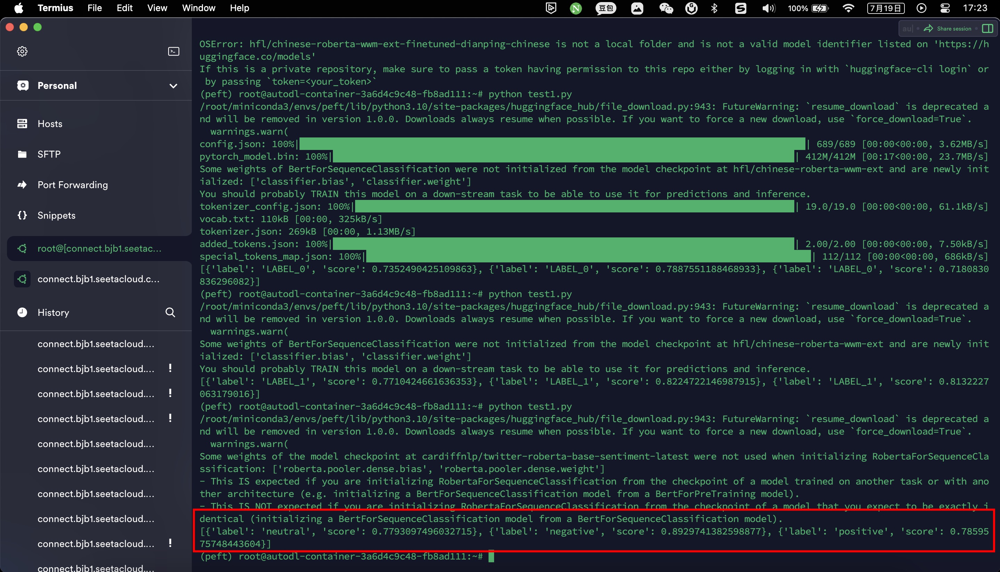

### Token Classification
 先用视频的例子跑一下

In [ ]:
from transformers import pipeline
classifier = pipeline(task="ner")
preds = classifier("Hugging Face is a French company based in New York City.")
preds = [
    {
        "entity": pred["entity"],
        "score": round(pred["score"], 4),
        "index": pred["index"],
        "word": pred["word"],
        "start": pred["start"],
        "end": pred["end"],
    }
    for pred in preds
]
print(*preds, sep="\n")

![image copy 4.png](<attachment:image copy 4.png>)
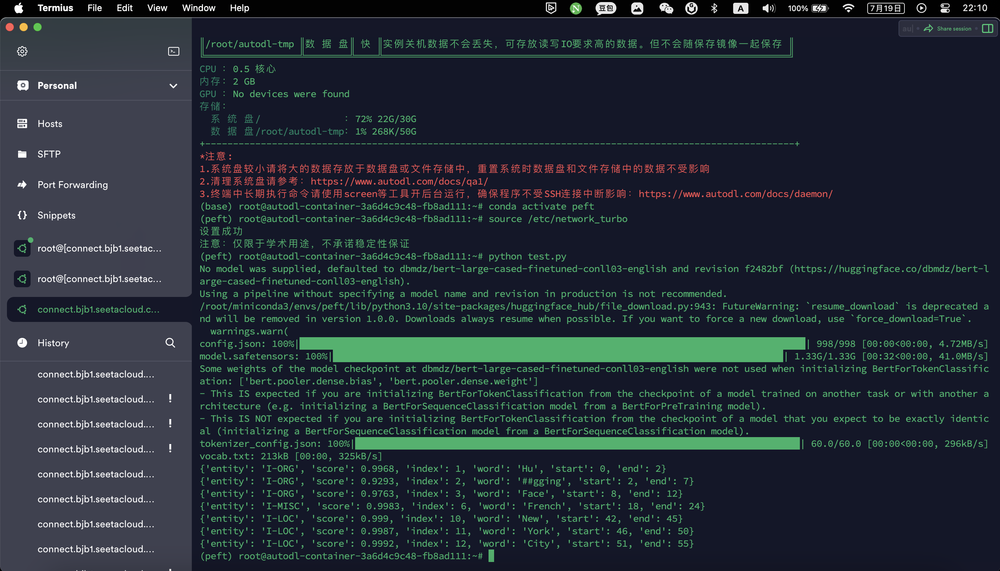

换成dslim/bert-base-NER模型在对比一下

In [ ]:
from transformers import pipeline
model_path='dslim/bert-base-NER'
classifier = pipeline(task="ner",model=model_path, tokenizer=model_path)
preds = classifier("Hugging Face is a French company based in New York City.")
preds = [
    {
        "entity": pred["entity"],
        "score": round(pred["score"], 4),
        "index": pred["index"],
        "word": pred["word"],
        "start": pred["start"],
        "end": pred["end"],
    }
    for pred in preds
]
print(*preds, sep="\n")

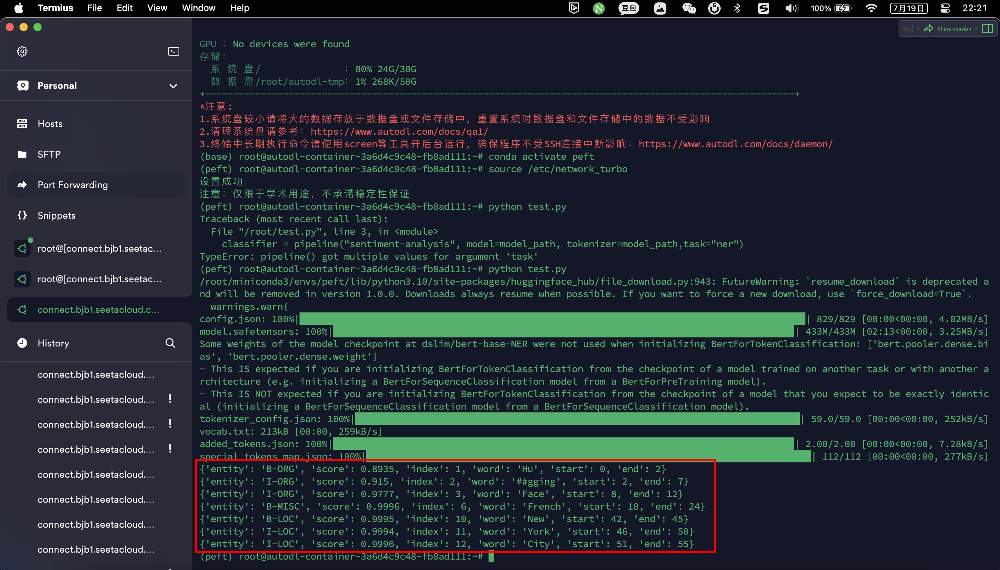

### Question Answering
先拍一下教程的例子

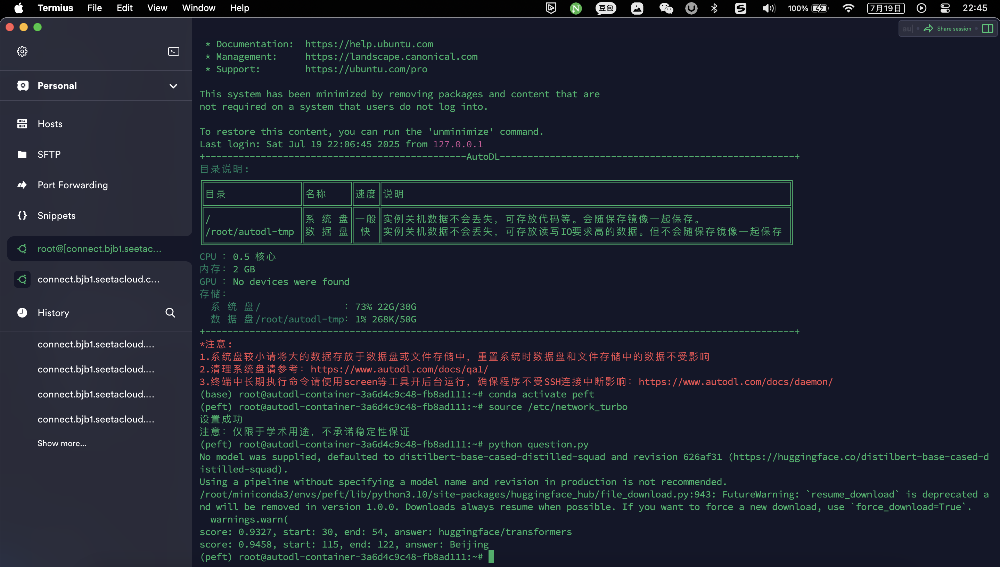

换模型再试一下

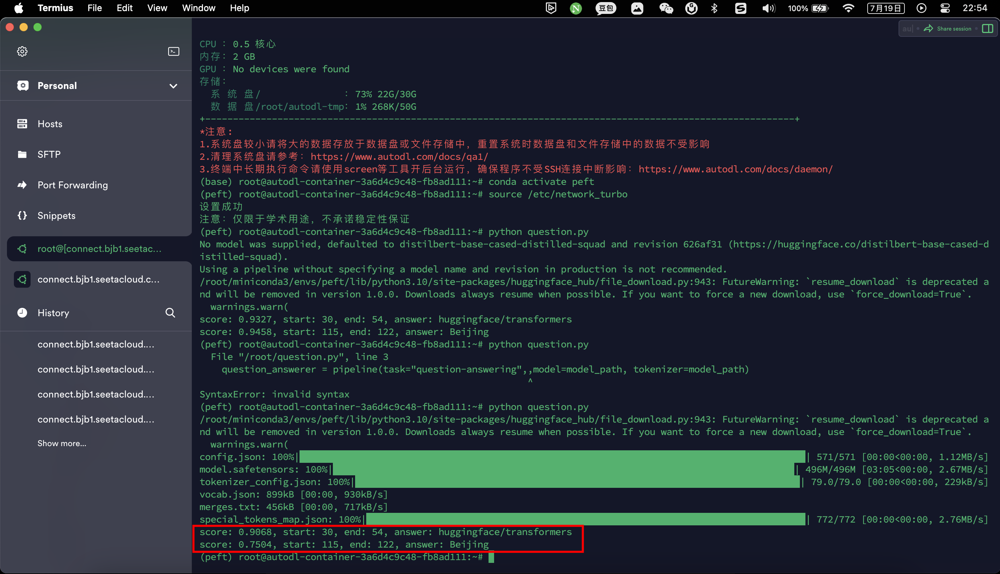

### Summarization
还是先跑教程的例子,用默认的t5-base无法识别，应该是模型名称改了。用的google/flan-t5-base

In [ ]:
from transformers import pipeline
summarizer = pipeline(task="summarization",
                      model="google/flan-t5-base",
                      min_length=8,
                      max_length=32,
)
print(summarizer(
    '''
    Large language models (LLM) are very large deep learning models that are pre-trained on vast amounts of data. 
    The underlying transformer is a set of neural networks that consist of an encoder and a decoder with self-attention capabilities. 
    The encoder and decoder extract meanings from a sequence of text and understand the relationships between words and phrases in it.
    Transformer LLMs are capable of unsupervised training, although a more precise explanation is that transformers perform self-learning. 
    It is through this process that transformers learn to understand basic grammar, languages, and knowledge.
    Unlike earlier recurrent neural networks (RNN) that sequentially process inputs, transformers process entire sequences in parallel. 
    This allows the data scientists to use GPUs for training transformer-based LLMs, significantly reducing the training time.
    '''
))

换sshleifer/distilbart-cnn-12-6模型在试一下
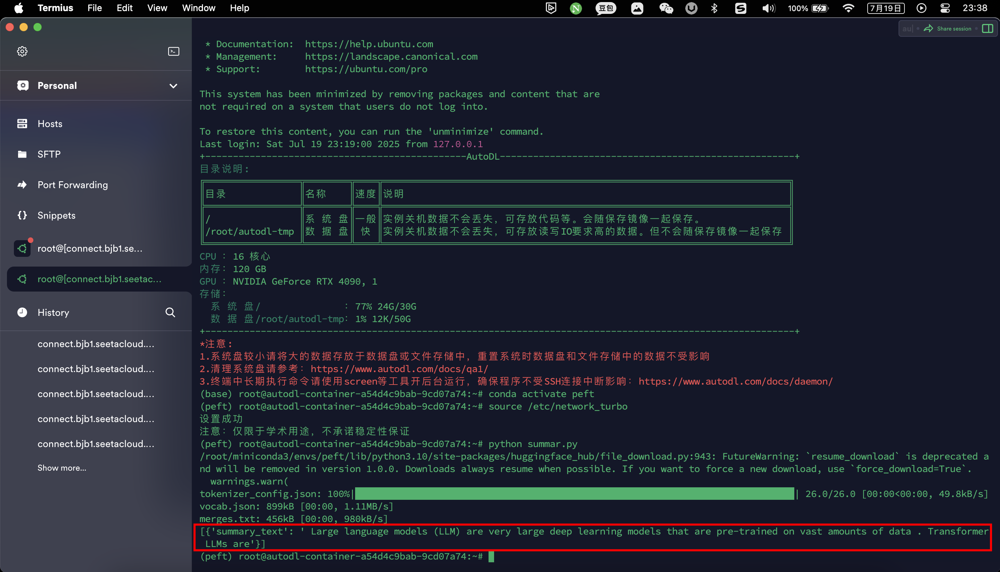

### Audio classification

先运行教程例子

In [ ]:
from transformers import pipeline
classifier = pipeline(task="audio-classification", model="superb/hubert-base-superb-er")
preds = classifier("https://huggingface.co/datasets/Narsil/asr_dummy/resolve/main/mlk.flac")
preds = [{"score": round(pred["score"], 4), "label": pred["label"]} for pred in preds]
print(preds)

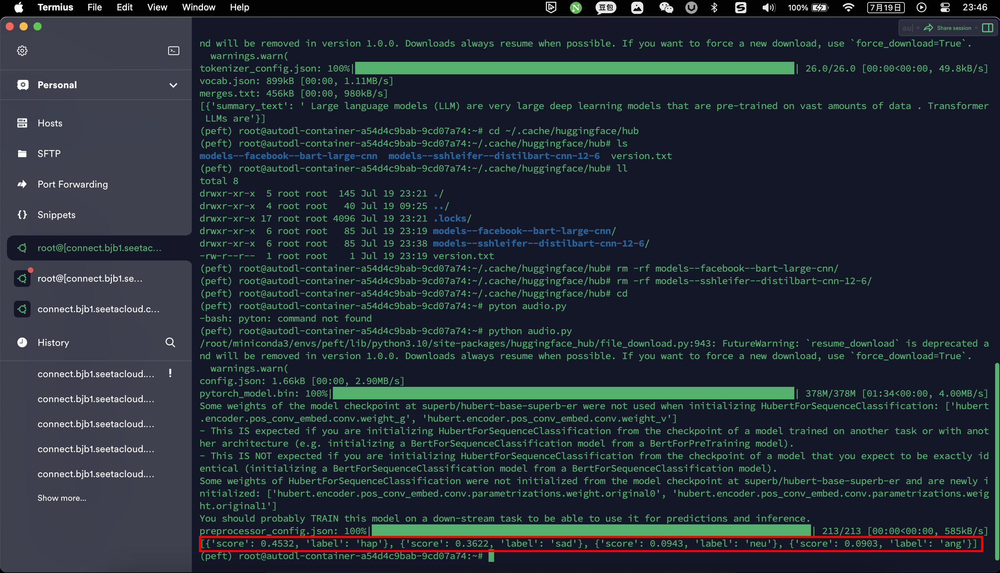

换模型'MIT/ast-finetuned-audioset-10-10-0.4593"'在试一下

In [ ]:
from transformers import pipeline
classifier = pipeline(task="audio-classification", model="MIT/ast-finetuned-audioset-10-10-0.4593")
preds = classifier("https://huggingface.co/datasets/Narsil/asr_dummy/resolve/main/mlk.flac")
preds = [{"score": round(pred["score"], 4), "label": pred["label"]} for pred in preds]
print(preds)

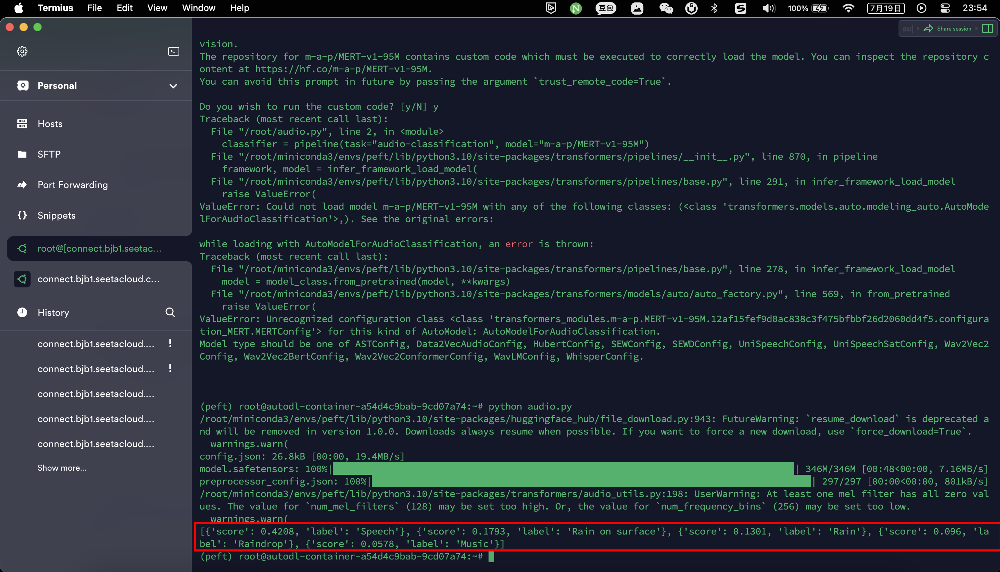

### Automatic speech recognition（ASR）

先跑一下课程的例子

In [ ]:
from transformers import pipeline
# 使用 `model` 参数指定模型
transcriber = pipeline(task="automatic-speech-recognition", model="openai/whisper-small")
text = transcriber("/root/autodl-tmp/datafile/mlk.flac")
print(text)

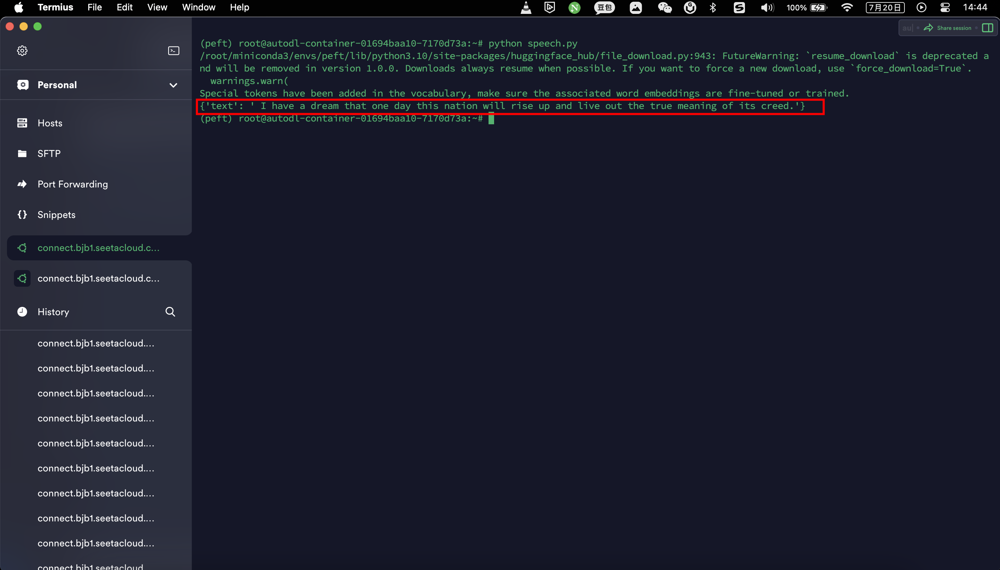

换'jonatasgrosman/wav2vec2-large-xlsr-53-portuguese'模型试一下，识别质量一下就差了很多

In [ ]:
from transformers import pipeline
# 使用 `model` 参数指定模型
transcriber = pipeline(task="automatic-speech-recognition", model="jonatasgrosman/wav2vec2-large-xlsr-53-portuguese")
text = transcriber("/root/autodl-tmp/datafile/mlk.flac")
print(text)

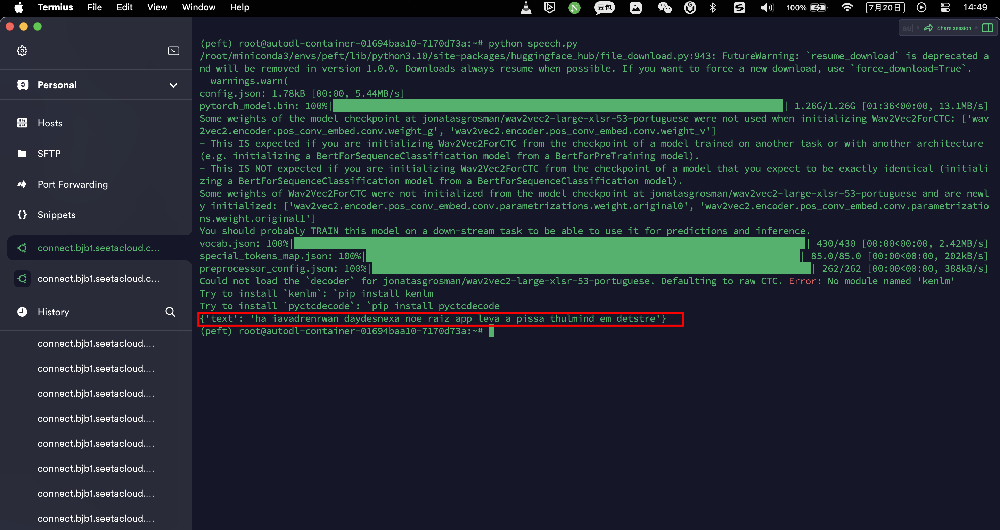

### Computer Vision

In [ ]:
from transformers import pipeline
classifier = pipeline(task="image-classification")
preds = classifier(
    "https://huggingface.co/datasets/huggingface/documentation-images/resolve/main/pipeline-cat-chonk.jpeg"
)
preds = [{"score": round(pred["score"], 4), "label": pred["label"]} for pred in preds]
print(*preds, sep="\n")

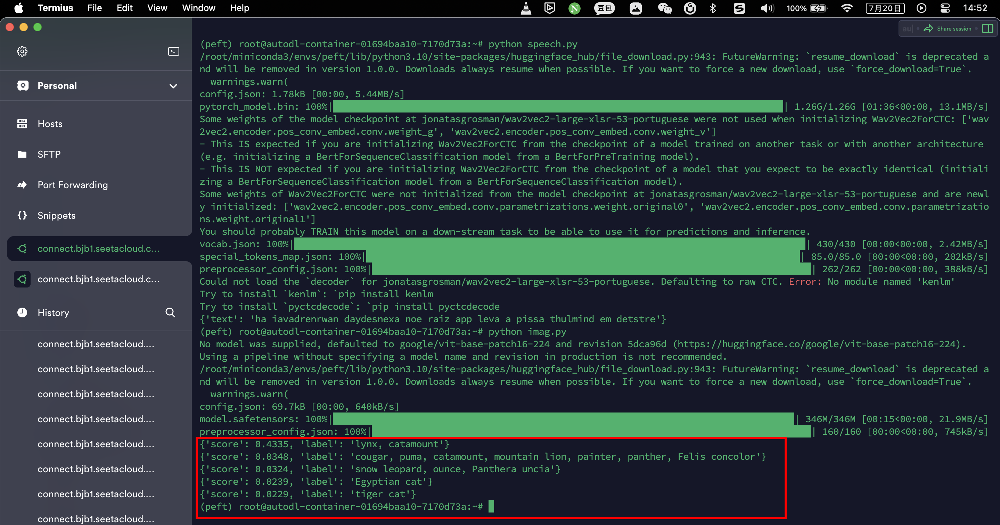

In [ ]:
换模型'Falconsai/nsfw_image_detection'试一下,差距就比较大了

In [ ]:
from transformers import pipeline
classifier = pipeline(task="image-classification",model='Falconsai/nsfw_image_detection')
preds = classifier(
    "https://huggingface.co/datasets/huggingface/documentation-images/resolve/main/pipeline-cat-chonk.jpeg"
)
preds = [{"score": round(pred["score"], 4), "label": pred["label"]} for pred in preds]
print(*preds, sep="\n")

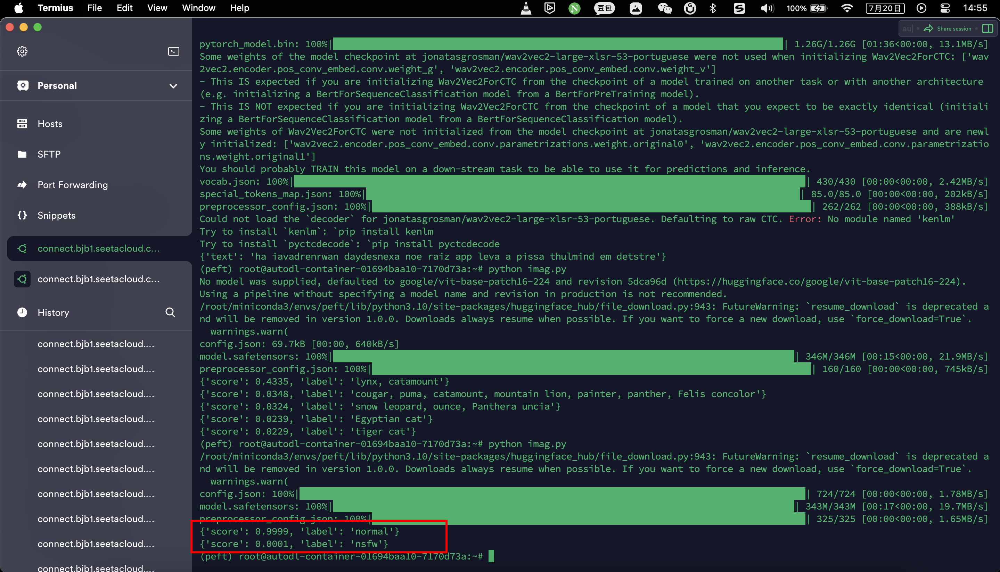

### Object Detection

先跑课程中的例子

In [ ]:
from transformers import pipeline
detector = pipeline(task="object-detection")
preds = detector(
    "https://huggingface.co/datasets/huggingface/documentation-images/resolve/main/pipeline-cat-chonk.jpeg"
)
preds = [{"score": round(pred["score"], 4), "label": pred["label"], "box": pred["box"]} for pred in preds]
print(preds)

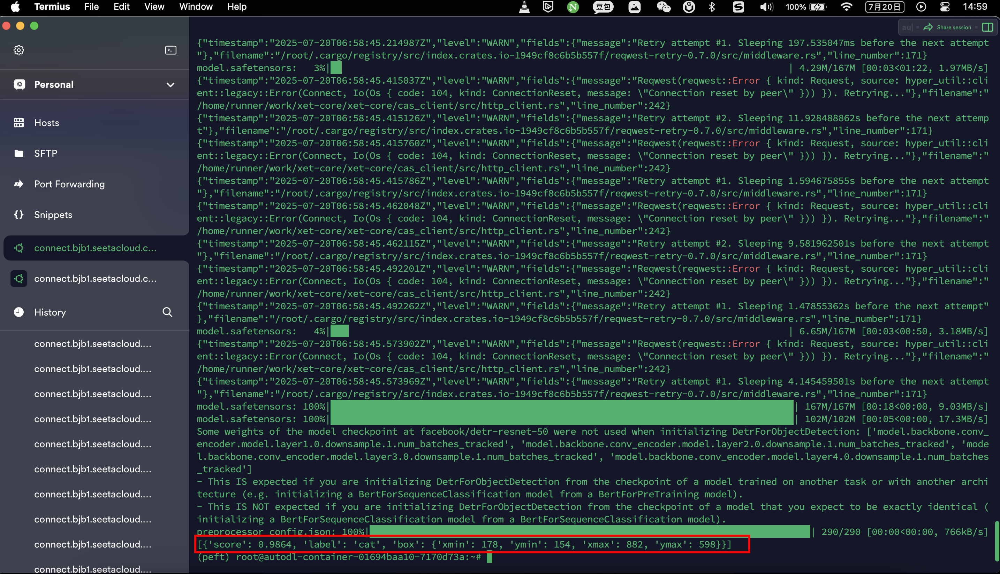

换'microsoft/table-transformer-structure-recognition'模型跑一下

In [ ]:
from transformers import pipeline
detector = pipeline(task="object-detection",model='microsoft/table-transformer-structure-recognition')
preds = detector(
    "https://huggingface.co/datasets/huggingface/documentation-images/resolve/main/pipeline-cat-chonk.jpeg"
)
preds = [{"score": round(pred["score"], 4), "label": pred["label"], "box": pred["box"]} for pred in preds]
print(preds)

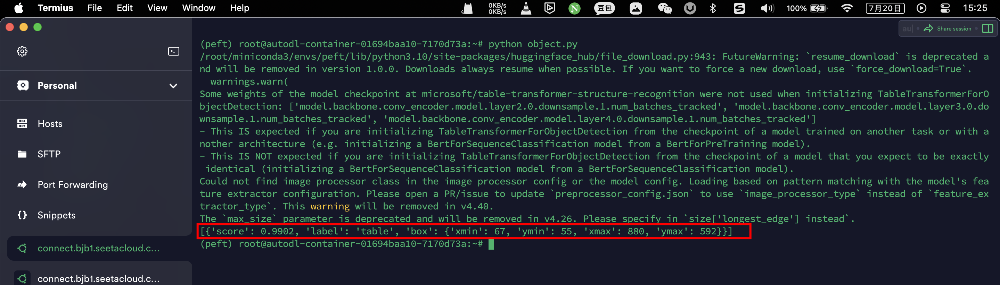